In [2]:
%config InlineBackend.figure_format = 'retina'
import matplotlib as mpl
import matplotlib.pyplot as plt
import xarray as xr
import os
import numpy as np
import pygmt

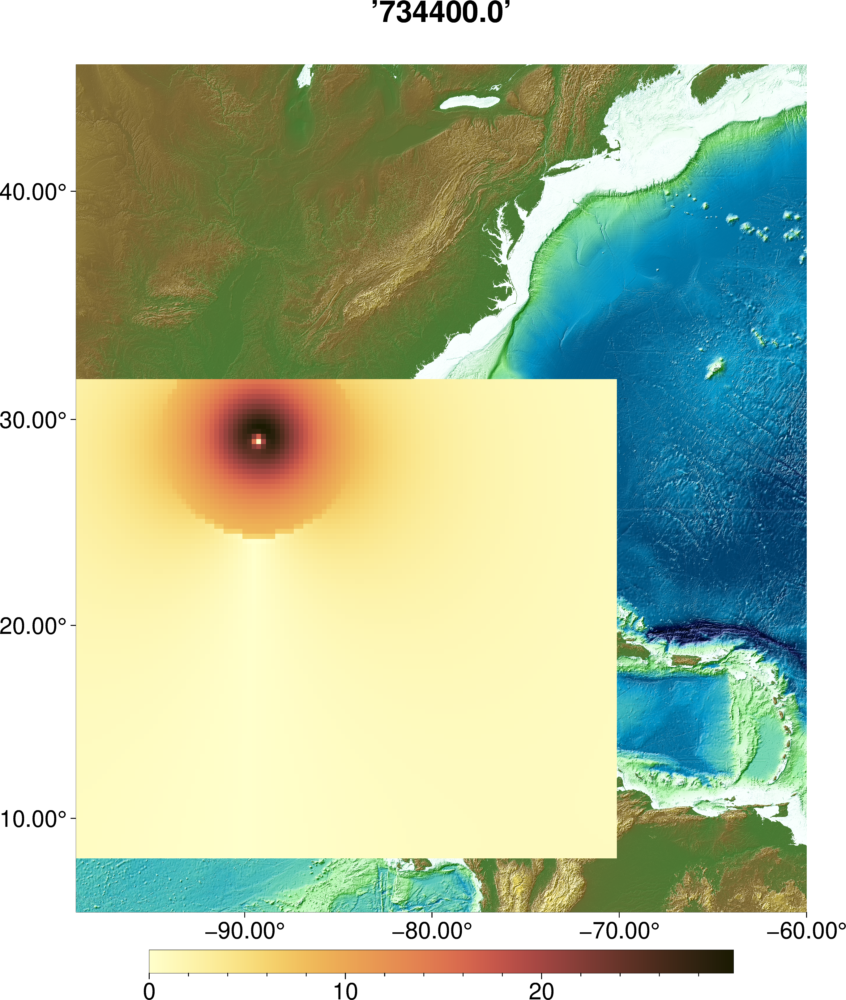

In [3]:
ds = xr.open_dataset('/home/catherinej/claw/clawpack/geoclaw/examples/isaac_data_derived/isaac.nc')
for i in range(34, 35):
    
    a = ds['speed'].isel(time=i)
    # b = a.where(a > 0.5)
# b = xr.where(a < .5, np.nan, a)
    fig = pygmt.Figure()
    pygmt.config(FONT_ANNOT='18p,Helvetica')
    pygmt.config(MAP_FRAME_TYPE='plain')
    pygmt.config(FORMAT_GEO_MAP='ddd.xx')
    pygmt.config(MAP_FRAME_PEN='.2p,black')
    fig.basemap(region=[-99, -60, 5, 45], projection='M20c', frame=['a', f"+t'{a.time.values}'"])

    fig.grdimage('/home/catherinej/bathymetry/gebco_2021_n53.0_s5.0_w-100.0_e-50.0.nc',
                 cmap='relief',
                shading=True)
    fig.grdimage(a, cmap='lajolla', nan_transparent=True, transparency='25')
    # fig.coast(land='black', water='skyblue')
    fig.colorbar()
    fig.show()

In [4]:
print(int(ds.time.isel(time=10).values))
# print(get_storm_time(ds

216000


In [5]:
def find_eye(pressure_data):
    # Calculate the location of the eye for all pressure arrays
    # Return None if the min pressure > 10000 because that
    # means the storm's eye is outside the domain

    # if pressure_data is in mbars or Pa
    if len(str(int(pressure_data[0].max()))) == 4:
        min_p = 990.00
    else:
        min_p = 99000.00
    eye_locs = [np.unravel_index(np.argmin(pressure), pressure.shape)
                if np.min(pressure) < min_p else None for pressure in pressure_data]


    return eye_locs
eyes = find_eye(ds.pressure.values)

In [6]:
for idx, eye in enumerate(eyes):
    # print(eye)
    if eye is not None:
        print(idx, ds.lon[eye[1]].values, ds.lat[eye[0]].values, ds.time.isel(time=idx).values)

27 -83.5 25.0 583200.0
28 -84.5 25.75 604800.0
29 -85.5 26.5 626400.0
30 -86.5 27.0 648000.0
31 -87.5 27.5 669600.0
32 -88.25 28.25 691200.0
33 -88.75 28.75 712800.0
34 -89.25 29.0 734400.0
35 -90.0 29.25 756000.0
36 -90.5 29.5 777600.0
37 -90.75 29.75 799200.0
38 -91.0 30.25 820800.0
39 -91.5 30.75 842400.0
40 -91.75 31.5 864000.0


# Create fig frame, font

fig = plt.figure(figsize=(10, 6))
ax = plt.axes((0.1, 0.1, 0.5, 0.8), projection=ccrs.Mercator(), frameon=True)
mpl.rcParams['pdf.fonttype'] =  42
mpl.rcParams['ps.fonttype'] = 42
mpl.rcParams['text.usetex'] = True
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] =  'lmtt'
ax.tick_params(axis='both', which='major', labelsize=20)
gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, 
                  linewidth=.1, color='black', alpha=1)
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 18, 'font': 'lmtt'}
gl.ylabel_style = {'size': 18, 'font': 'lmtt'}
ax.set_extent([-99, -60, 5, 45], ccrs.Geodetic())
ax.coastlines()
ax.stock_img()
ax.pcolormesh(a.lon, a.lat, a.values, transform=ccrs.PlateCarree(), cmap='seismic', alpha=.75)

# ax.set_xticks(crs=ccrs.PlateCarree())
plt.show()

In [7]:
def combine_patches(patch):
    lat = patch['Yc'][0]
    lon = patch['Xc'][:,0]
    wind_x = patch['wind_x'].T
    wind_y = patch['wind_y'].T 
    water = patch['water'].T
    land = patch['land'].T
    ds = xr.Dataset(data_vars={'u':(('lat', 'lon'), wind_x), 
                              'v':(('lat', 'lon'), wind_y),
                              'land':(('lat', 'lon'), land),
                              'water':(('lat','lon'), water)},
                   coords={'lat': lat,
                          'lon': lon})
    return ds

def organize_patches(patch_dict):
    ds_dict = {}
    amr_max = max(int(d['amr_level']) for d in patch_dict.values())
    for i in range(1, amr_max + 1, 1):
        ds_dict[i] = []
    for patch_no in patch_dict: 
        t = patch_dict[patch_no]['time']
        amr = patch_dict[patch_no]['amr_level']
        timestep = round(t/3600,2)
        ds = combine_patches(patch_dict[patch_no])
        ds_dict[patch_dict[patch_no]['amr_level']].append(ds) 
    return ds_dict, timestep

def get_corners(lon, lat, xdelta, ydelta):
    x = [x + 0.5*xdelta for x in lon]
    y = [y + 0.5*ydelta for y in lat]
    xs = [x[0], x[-1], x[-1], x[0], x[0]]
    ys = [y[0], y[0], y[-1], y[-1], y[0]]
    corners = np.array([[x[0], y[0], x[-1], y[-1]]])
    return xs, ys, corners

In [8]:
def read_fortq(frame, path):
    """
    Import fort.q files to get x,y,z data
    """
    from clawpack.pyclaw import solution
    fortq = solution.Solution(frame, path=path, file_format='ascii')
    patch_dict = {}
    for stateno, state in enumerate(fortq.states):
        patch = state.patch
        time = state.t
        this_level = patch.level
        Xc, Yc = state.grid.c_centers
        X_edge, Y_edge = state.grid.c_edges
        delta = patch.delta
        mask_coarse = np.empty(Xc.shape, dtype=bool)
        mask_coarse.fill(False)
        for stateno_fine, state_fine in enumerate(fortq.states):
            patch_fine = state_fine.patch
            if patch_fine.level != this_level+1:
                continue
            xlower_fine = patch_fine.dimensions[0].lower
            xupper_fine = patch_fine.dimensions[0].upper
            ylower_fine = patch_fine.dimensions[1].lower
            yupper_fine = patch_fine.dimensions[1].upper

            m1 = (Xc > xlower_fine) & (Xc < xupper_fine)
            m2 = (Yc > ylower_fine) & (Yc < yupper_fine)
            mask_coarse = (m1 & m2) | mask_coarse
        # s = speed(state)
        h = state.q[0,:,:]
        eta = state.q[3,:,:]
        wind_x = state.aux[4,:,:]
        wind_y = state.aux[5,:,:]
        print(wind_x.shape)
        drytol_default = 0.001
        topo = eta - h
        b = state.aux[0,:,:]
        water = np.ma.masked_where(h<= drytol_default, np.where(topo<0, eta, h))
        land = np.ma.masked_where(h>drytol_default, eta)
        patch_dict[stateno] = {'amr_level':this_level, 'Xc':Xc, 'Yc':Yc, 'water':water, 
                               'land':land, 'delta':delta,  'time':time, 'wind_x': wind_x, 'wind_y': wind_y}
    return patch_dict

In [9]:
SOURCE_DIR = '/home/catherinej/old_clawpack/clawpack-v5-8-2/geoclaw/examples/storm-surge/isaac/'
patch_dict = read_fortq(7, os.path.join(SOURCE_DIR, '_output'))

(30, 48)
(30, 48)
(30, 48)
(30, 48)
(28, 48)
(28, 48)
(28, 48)
(28, 48)
(42, 38)


/home/catherinej/claw/clawpack/pyclaw/src/pyclaw/geometry.py:375: UserWarning: 'edges' has been deprecated; please use 'nodes' instead.
  warnings.warn(deprec_message)


In [10]:
ds_dict, ts = organize_patches(patch_dict)

In [11]:
for amr in ds_dict:
    ds_list = ds_dict[amr]
    for ds in ds_list:
        xs, ys, corners = get_corners(ds.lon.values, ds.lat.values, ds.lon[1]-ds.lon[0], ds.lat[1] - ds.lat[0])
        

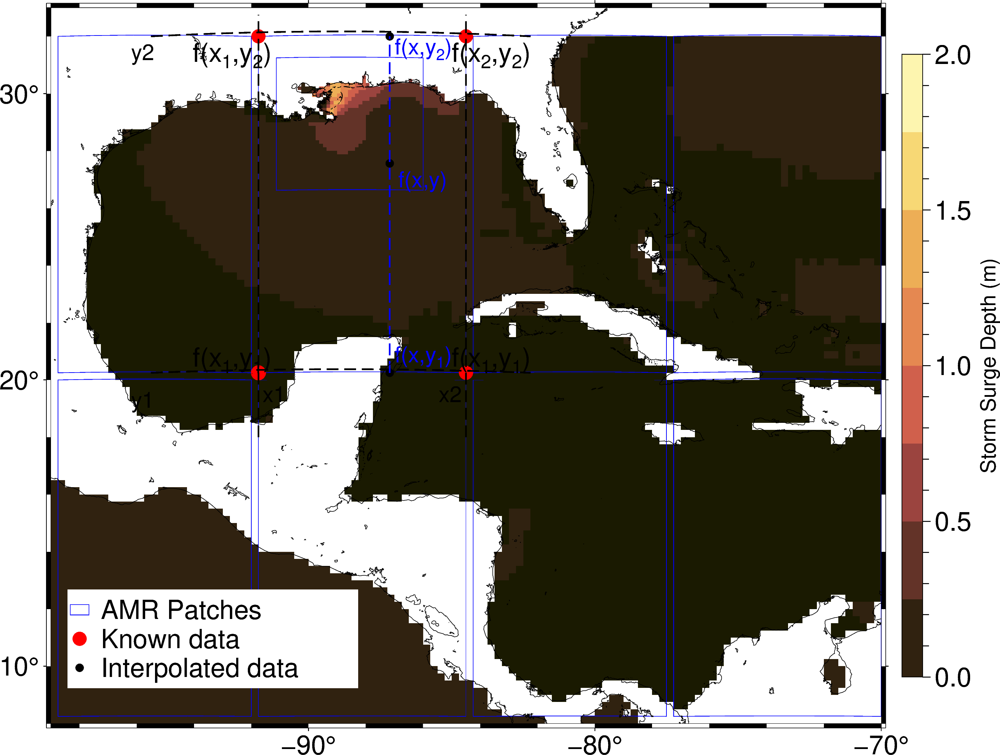

In [12]:
grid = pygmt.datasets.load_earth_relief(resolution='30s', region=[-99, -60, 5, 45])
fig = pygmt.Figure()
pygmt.config(FONT_ANNOT='18p,Helvetica')
pygmt.config(FORMAT_GEO_MAP='ddd')
pygmt.config(MAP_FRAME_PEN='.4p,black')
pygmt.makecpt(cmap='lajolla', series=[0,2,.25], reverse=True)
fig.basemap(region=[-99.0, -70.0, 8, 33.], projection='Q20c', frame=['WSne', 'af'] )#'xa1.5f.5', 'ya1f.5'])
# fig.grdimage(a, nan_transparent=True, transparency=25)
for amr in ds_dict:
# [[-91.75  20.25 -84.5   32.  ]]
# [[-91.125  26.625 -86.     31.25 ]
    Q11 = [[-91.75, 20.25]]
    Q12 = [[-91.75, 32.0]]
    Q21 = [[-84.5, 20.25]]
    Q22 = [[-84.5, 32.]]
    
    x = np.array([-91.75-3, -84.5+3])
    y = np.array([20.25-1.5, 32.0+1.5])
    y1 = np.array([20.25, 20.25])
    y2 = np.array([32., 32.0])
    x1 = np.array([-91.75, -91.75])
    x2 = np.array([-84.5, -84.5])
    xx = -87.16490062544864 #np.random.uniform(-91.125, -86.00)
    yy = 27.561652996662453 #np.random.uniform(26.625, 31.25)
    
    
    ds_list = ds_dict[amr]
    for ds in ds_list:
        if amr == 2:
            xs, ys, corners = get_corners(ds.lon.values, ds.lat.values, ds.lon[1]-ds.lon[0], ds.lat[1] - ds.lat[0])
            fig.grdimage(ds.water, nan_transparent=False, verbose='q')
            fig.plot(corners, style='r+s', pen='.3p,blue', label='AMR Patches')
        else:
            xs, ys, corners = get_corners(ds.lon.values, ds.lat.values, ds.lon[1]-ds.lon[0], ds.lat[1] - ds.lat[0])
            fig.grdimage(ds.water, nan_transparent=False, verbose='q')
            fig.plot(corners, style='r+s', pen='.3p,blue')
        
        
fig.plot(Q11, style='c0.32c', pen='1p,red', fill='red')
fig.text(text=r'f(x@-1@-,y@-1@-)', x=Q11[0][0]-0.95, y=Q11[0][1]+0.55, font='18p,Helvetica,black')

fig.plot(Q12, style='c0.3c', pen='1p,red', fill='red')
fig.text(text=r'f(x@-1@-,y@-2@-)', x=Q12[0][0]-0.95, y=Q12[0][1]-0.55, font='18p,Helvetica,black')

fig.plot(Q21, style='c0.3c', pen='1p,red', fill='red')
fig.text(text=r'f(x@-1@-,y@-1@-)', x=Q21[0][0]+0.85, y=Q21[0][1]+0.55, font='18p,Helvetica,black')

fig.plot(Q22, style='c0.3c', pen='1p,red', fill='red', label='Known data')
fig.text(text=r'f(x@-2@-,y@-2@-)', x=Q22[0][0]+0.85, y=Q22[0][1]-0.55, font='18p,Helvetica,black')

fig.plot(x=x-.75, y=np.array([20.25, 20.25]), pen='1p,black,-')
fig.text(text='y1', x=x[0]-1.05, y=y[0]+0.55,font='15p,Helvetica,black')

fig.plot(x=x-.75, y=y2, pen='1p,black,-')
fig.text(text='y2', x=x[0] -1.05, y=y2[0]-0.55,font='15p,Helvetica,black')

fig.plot(x=x1, y=y-.75, pen='1p,black,-')
fig.text(text='x1', x=x1[0]+0.55, y=y1[0]-.75, font='15p,Helvetica,black')

fig.plot(x=x2, y=y-.75, pen='1p,black,-')
fig.text(text='x2', x=x2[0]-0.55, y=y1[0]-.75, font='15p,Helvetica,black')

fig.plot(x=xx, y=y2[0],style='p0.2c', pen='1p,red,-')
fig.text(text='f(x,y@-2@-)', x=xx+1.15, y=y2[0]-0.35, font='15p,Helvetica,blue')

fig.plot(x=xx, y=y1[0],style='p0.2c', pen='1p,red,-')
fig.text(text='f(x,y@-1@-)', x=xx+1.15, y=y1[0]+0.65, font='15p,Helvetica,blue')

fig.plot(x=xx, y=yy, style='p0.2c', label='Interpolated data')
fig.text(text='f(x,y)', x=xx+1.15, y=yy-0.55, font='15p,Helvetica,blue')

fig.plot(x=np.array([xx,xx]), y=np.array([y1[0], y2[0]]), direction=[0], pen='1p,blue,-')
# fig.grdimage(grid=grid, projection = 'M20c', frame='a', cmap='batlow', shading=True)


fig.legend(position='JBL+jBL+w7c+o0.4c/.85c', box='+gwhite')
fig.coast(shorelines='thinnest,black')
# "JTR+jTR+w7c+o0.2c"
fig.colorbar(position='JMR+o0.5c/0c+w15c/.5+mc', frame=['x+l"Storm Surge Depth (m)"'])
fig.show()
# fig.savefig('amr_surge.png')

In [28]:
fig.savefig('bilinear_transparent.pdf')

In [128]:
fig.savefig('bilinear_amr.pdf')

In [25]:
data_storm_path = '/home/catherinej/claw/isaac_data_derived/'
data_patch_dict = read_fortq(23, os.path.join(data_storm_path, '_output'))

(30, 48)
(30, 48)
(30, 48)
(30, 48)
(28, 48)
(28, 48)
(28, 48)
(28, 48)
(44, 38)


In [26]:
data_ds_dict, ts = organize_patches(data_patch_dict)

In [12]:
dd = xr.open_dataset('/home/catherinej/claw/geoclaw/scratch/isaac_data_derived.nc')
for i in range(len(dd)):
    dd.speed[i].plot()
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: b'/home/catherinej/claw/geoclaw/scratch/isaac_data_derived.nc'

In [20]:
input_ds = xr.open_dataset('/home/catherinej/claw/isaac_data_derived/isaac.nc')
input_ds

<xarray.Dataset>
Dimensions:   (time: 42, lat: 96, lon: 116)
Coordinates:
  * lat       (lat) float64 8.0 8.25 8.5 8.75 9.0 ... 31.0 31.25 31.5 31.75
  * lon       (lon) float64 -99.0 -98.75 -98.5 -98.25 ... -70.75 -70.5 -70.25
  * time      (time) float64 0.0 2.16e+04 4.32e+04 ... 8.64e+05 8.856e+05
Data variables:
    u         (time, lat, lon) float64 ...
    v         (time, lat, lon) float64 ...
    speed     (time, lat, lon) float64 ...
    pressure  (time, lat, lon) float64 ...

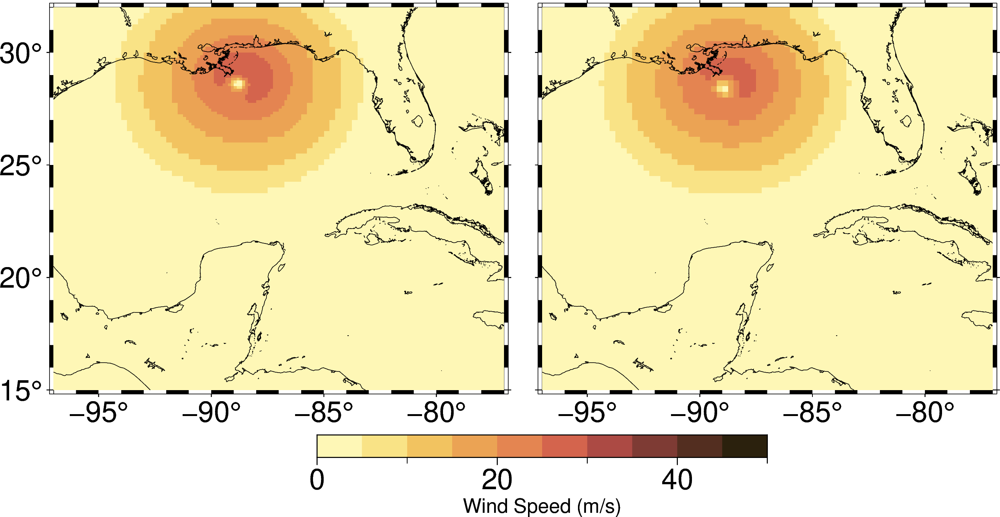

In [28]:
grid = pygmt.datasets.load_earth_relief(resolution='30s', region=[-99, -60, 5, 45])
fig = pygmt.Figure()
pygmt.config(FONT_ANNOT='18p,Helvetica')
pygmt.config(FORMAT_GEO_MAP='ddd')
pygmt.config(MAP_FRAME_PEN='.4p,black')
pygmt.makecpt(cmap='lajolla', series=[0,50,5], reverse=False)

#Map elements
region=[-97.0, -77.0, 15, 32]
fig.basemap(region=region,  frame=['WSne', 'af'],projection='Q10c')
for k, val in ds_dict.items():
    data_array = [np.sqrt(ds.u**2 + ds.v**2) for ds in val]
    for da in data_array:
        fig.grdimage(da, nan_transparent=True, verbose='q')
fig.coast(shorelines='thinnest,black')
# fig.colorbar(frame=['x+l"Storm Surge Depth (m)"'])
fig.shift_origin(xshift='w+0.85c')
fig.basemap(region=region,  frame=['wSne', 'af'], projection='Q10c')
for amr in data_ds_dict:
    if amr == 1:
        data_ds_list = data_ds_dict[amr]
        for ds in data_ds_list:
            wind_speed = np.sqrt(ds.u**2 + ds.v**2)
            fig.grdimage(wind_speed, nan_transparent=True, verbose='q')
# fig.grdimage(a)
fig.coast(shorelines='thinnest,black')
fig.colorbar(position='JBC+jBC+o-5.c/-1.5c+w10c/0.5c+h', frame=['x+l"Wind Speed (m/s)"']) #, position='JMR+o1.55c/0c+w18c/1c'
fig.savefig('compare_winds_transparent.png', transparent=True)
fig.show()

# fig.grdimage(a, nan_transparent=True, transparency=25)


In [95]:
test = [[np.sqrt(ds.u**2 + ds.v**2) for ds in r] for (k,r) in data_ds_dict.items()]


In [155]:
import os
os.getcwd()

'/home/catherinej/figure_making/ICTAS_poster_figs'

In [35]:
fig = pygmt.Figure()
for amr in data_ds_dict:
    print(amr)
    data_ds_list = data_ds_dict[amr]
    for ds in data_ds_list:
data_ds_list

IndentationError: expected an indented block after 'for' statement on line 5 (3129852061.py, line 6)

In [52]:
region = [-99, -77, 5, 32]

basemap [ERROR]: Option -c is not a recognized common option
subplot [ERROR]: No subplot information file!


GMTCLibError: Module 'subplot' failed with status code 15:
subplot [ERROR]: No subplot information file!

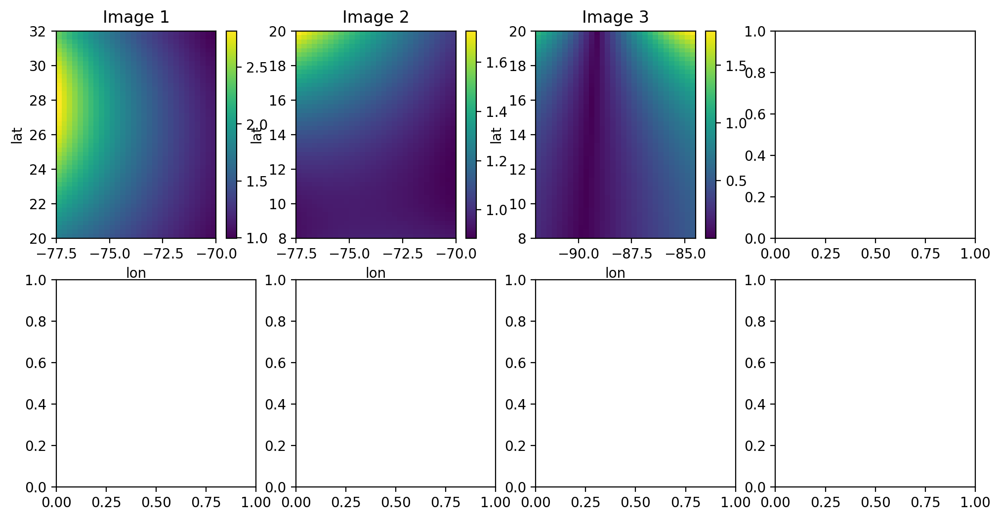

In [65]:

# Assuming you have a list of xarray datasets called 'datasets'
# Select the relevant DataArrays from each dataset (adjust as needed)
data_arrays = [np.sqrt(ds.u**2 + ds.v**2) for ds in data_ds_dict[1]]

# Create a 2x4 grid of subplots
fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(12, 6))
fig = pygmt.Figure()
# Iterate through the DataArrays and plot them
with fig.subplot(nrows=2, ncols=4, figsize=("15c", "6c"), frame="lrtb"):
    for i, da in enumerate(data_arrays):
        # print(da)
        if i in [3,6]:
            fig = pygmt.Figure()
            fig.basemap(region=region, frame=True)
            fig.grdimage(da)
        else:
            
            fig.basemap(region=region, frame=['WSne', 'af'], panel=i)
            fig.grdimage(da, region=region, nan_transparent=True, panel=i)
            row, col = divmod(i, 4)  # Calculate row and column indices
            ax = axes[row, col]
            da.plot(ax=ax)# Customize colormap if desired
            axes[row, col].set_title(f"Image {i+1}")

# Add any other customizations (labels, titles, etc.) as needed
fig.show()
# Show the plot
plt.tight_layout()  # Adjust subplot spacing
plt.show()


In [124]:
region

[-97.0, -77.0, 15, 32]

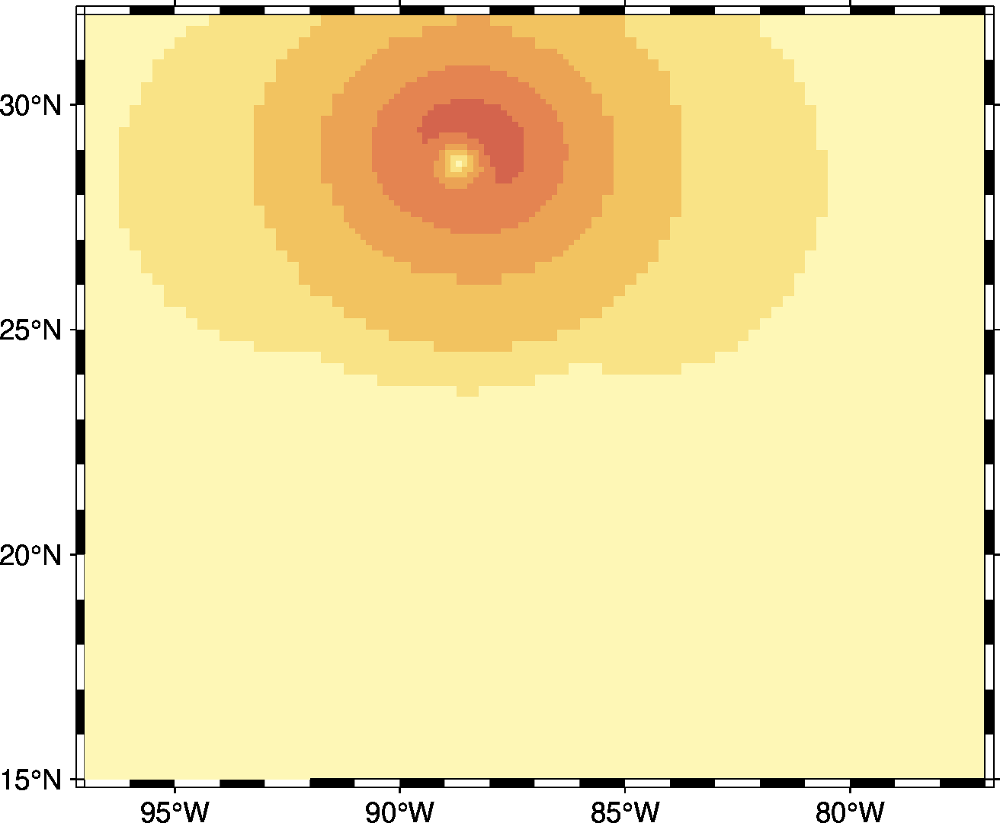

In [126]:
# with fig.subplot(nrows=2, ncols=4, figsize=("15c", "6c"), frame="lrtb"):
# fig = pygmt.Figure()
grid = pygmt.datasets.load_earth_relief(resolution='30s', region=[-99, -60, 5, 45])
fig = pygmt.Figure()
# pygmt.config(FONT_ANNOT='18p,Helvetica')
# pygmt.config(FORMAT_GEO_MAP='ddd')
# pygmt.config(MAP_FRAME_PEN='.4p,black')
# pygmt.makecpt(cmap='lajolla', series=[0,50,5], reverse=False)

#Map elements
# region=[-97.0, -77.0, 15, 32]
# fig.basemap(region=region, projection='M10c', frame=['Wsne', 'af'])
pygmt.makecpt(cmap='lajolla', reverse=False, series=[0,50,5])
for i, da in enumerate(data_arrays):
    fig.basemap(region=region, frame=True, projection='Q10c' )
    fig.grdimage(da, nan_transparent=True)

    # fig.basemap(region=region, frame=True)
    # fig.grdimage(da)
fig.grdimage(np.sqrt(data_ds_dict[2][0]['u']**2 + data_ds_dict[2][0]['v']**2))
fig.show()

In [80]:
dss = data_ds_dict[2][0]

In [ ]:
def get_corners(x, y):
    xs = [x[0], x[-1], x[-1], x[0], x[0]]
    ys = [y[0], y[0], y[-1], y[-1], y[0]]
    corners = np.array([[x[0], y[0], x[-1], y[-1]]])
    return xs, ys, corners

In [253]:
fig.savefig('wind_compare_isaac.png')

In [6]:
fig = pygmt.Figure()
pygmt.config(FONT_ANNOT='18p,Helvetica')

pygmt.config(FORMAT_GEO_MAP='ddd')
pygmt.config(MAP_FRAME_PEN='.4p,black')
pygmt.makecpt(cmap='lajolla', series=[0,50,5], reverse=False)

#Map elements
region=[-94.0, -82.0, 20, 32]
fig.basemap(region=region, projection='M10c', frame=['WSne', 'af'])
for amr in ds_dict:

    ds_list = ds_dict[amr]

    for ds in ds_list:
        wind_speed = np.sqrt(ds.u**2 + ds.v**2)
        fig.grdimage(wind_speed, nan_transparent=True, verbose='q')
        xs, ys, corners = get_corners(ds.lon.values, ds.lat.values, ds.lon[1]-ds.lon[0], ds.lat[1] - ds.lat[0])
        fig.plot(corners, style='r+s', pen='.3p,blue')
fig.coast(shorelines='thinnest,black')
fig.colorbar(frame=['x+l"Wind Speed (m/s)"'], position='JMR+o.75c/0c+w10c/.5c')
fig.show()

NameError: name 'ds_dict' is not defined

In [251]:
fig.savefig('isaac_wind_amr.png')

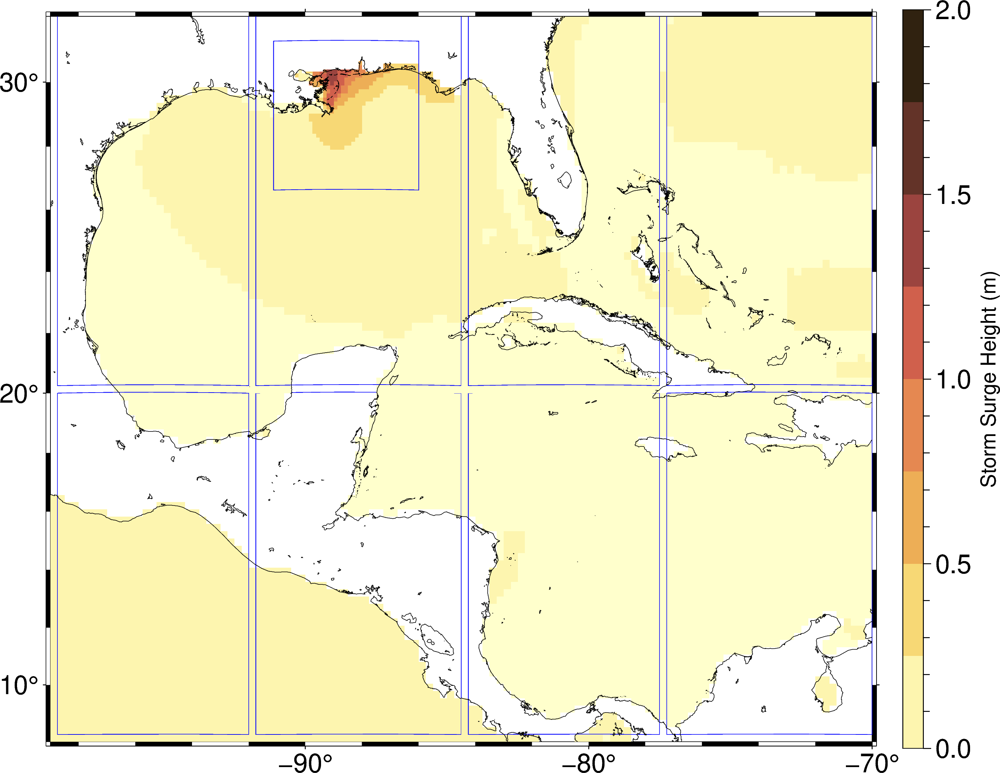

In [260]:
grid = pygmt.datasets.load_earth_relief(resolution='30s', region=[-99, -60, 5, 45])
fig = pygmt.Figure()
pygmt.config(FONT_ANNOT='18p,Helvetica')
pygmt.config(FORMAT_GEO_MAP='ddd')
pygmt.config(MAP_FRAME_PEN='.4p,black')
pygmt.makecpt(cmap='lajolla', series=[0,2,.25], reverse=False)
fig.basemap(region=[-99.0, -70.0, 8, 32.0], projection='M20c', frame=['WSne', 'af'] )#'xa1.5f.5', 'ya1f.5'])

for amr in ds_dict:
    ds_list = ds_dict[amr]
    for ds in ds_list:
       
        xs, ys, corners = get_corners(ds.lon.values, ds.lat.values, ds.lon[1]-ds.lon[0], ds.lat[1] - ds.lat[0])
        fig.grdimage(ds.water, nan_transparent=True, verbose='q')
        fig.plot(corners, style='r+s', pen='.3p,blue')
fig.coast(shorelines='thinnest,black')
fig.colorbar(frame=['x+l"Storm Surge Height (m)"'], position='JMR+o.75c/0c+w18c/.5c')
fig.show()

In [261]:
fig.savefig('isaac_amr_surge.png')

In [280]:
a

<xarray.DataArray 'speed' (lat: 105, lon: 97)>
array([[0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ],
       ...,
       [2.601141, 2.237895, 1.81761 , ..., 9.688798, 9.610904, 9.533272],
       [2.585134, 2.21977 , 1.831788, ..., 9.707595, 9.62866 , 9.549899],
       [2.605056, 2.266021, 1.946372, ..., 9.719991, 9.642664, 9.565383]])
Coordinates:
  * lat      (lat) float64 22.0 22.25 22.5 22.75 23.0 ... 47.25 47.5 47.75 48.0
  * lon      (lon) float64 -82.0 -81.75 -81.5 -81.25 ... -58.5 -58.25 -58.0
    time     float64 2.58e+05

In [1]:
storm_1938_path = '/home/catherinej/multi/moriches_6'
patch_dict_1938 = read_fortq(7, os.path.join(storm_1938_path, '_output'))
ds_dict_1938, ts = organize_patches(data_patch_dict)

NameError: name 'read_fortq' is not defined